In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%qtconsole
%config InlineBackend.figure_format = 'retina'

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

import logging
logging.basicConfig(level=logging.INFO)

In [3]:
epoch_key = ('HPa', 6, 2)


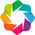

INFO:src.analysis:Detecting ripples
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO06.mat
ERROR:loren_frank_data_processing.core:Failed to load file: /Users/edeno/Documents/GitHub/Jadhav-2016-Data-Analysis/src/../Raw-Data/HPa_direct/HPaDIO06.mat


In [4]:
from src.analysis import detect_epoch_ripples
from src.parameters import (ANIMALS, SAMPLING_FREQUENCY)

ripple_times = detect_epoch_ripples(
    epoch_key, ANIMALS, SAMPLING_FREQUENCY)

In [5]:
from loren_frank_data_processing import make_neuron_dataframe

neuron_info = make_neuron_dataframe(ANIMALS).xs(
    epoch_key, drop_level=False).query('numspikes > 0')

In [6]:
from loren_frank_data_processing import make_tetrode_dataframe

tetrode_info = make_tetrode_dataframe(ANIMALS).xs(epoch_key, drop_level=False)

In [7]:
from loren_frank_data_processing import reshape_to_segments, get_spike_indicator_dataframe


def get_ripple_locked_spikes(neuron_key, ripple_times, animals,
                             sampling_frequency=1, window_offset=(-0.5, 0.5)):
    spikes = get_spike_indicator_dataframe(neuron_key, animals)
    return reshape_to_segments(
        spikes, ripple_times, window_offset, sampling_frequency)

window_offset = (-0.250, 0.250)



In [8]:
from spectral_connectivity.transforms import _sliding_window
from spectral_connectivity import Multitaper, Connectivity

def coherence_rate_adjustment(firing_rate_condition1,
                              firing_rate_condition2, spike_power_spectrum,
                              homogeneous_poisson_noise=0, dt=1):
    '''Correction for the spike-field or spike-spike coherence when the
    conditions have different firing rates.

    When comparing the coherence of two conditions, a change in firing rate
    results in a change in coherence without an increase in coupling.
    This adjustment modifies the coherence of one of the conditions, so
    that a difference in coherence between conditions indicates a change
    in coupling, not firing rate. See [1] for details.

    If using to compare spike-spike coherence, not that the coherence
    adjustment must be applied twice, once for each spike train.
    Adjusts `firing_rate_condition1` to `firing_rate_condition2`.
    
    Parameters
    ----------
    firing_rate_condition1, firing_rate_condition2 : float
        Average firing rates for each condition.
    spike_power_spectrum : ndarray, shape (n_frequencies,)
        Power spectrum of the spike train in condition 1.
    homogeneous_poisson_noise : float, optional
        Beta in [1].
    dt : float, optional
        Size of time step.
        
    Returns
    -------
    rate_adjustment_factor : ndarray, shape (n_frequencies,)
    
    References
    ----------
    .. [1] Aoi, M.C., Lepage, K.Q., Kramer, M.A., and Eden, U.T. (2015).
           Rate-adjusted spike-LFP coherence comparisons from spike-train
           statistics. Journal of Neuroscience Methods 240, 141-153.

    '''
    # alpha in [1]
    firing_rate_ratio = firing_rate_condition2 / firing_rate_condition1
    adjusted_firing_rate = (
        (1 / firing_rate_ratio - 1) * firing_rate_condition1 +
        homogeneous_poisson_noise / firing_rate_ratio ** 2) * dt ** 2
    return 1 / np.sqrt(1 + (adjusted_firing_rate / spike_power_spectrum))


def adjusted_coherence_magnitude(spikes, sampling_frequency, m, c):
    '''
    
    Parameters
    ----------
    spikes : ndarray, shape (n_time, n_trials, n_signals)
    sampling_frequency : float
    **multitaper_params : kwargs
    
    Returns
    -------
    adjusted_coherence_magnitude : ndarray, shape (n_time, n_frequencies, n_signals, n_signals)

    '''

    dt = 1.0 / sampling_frequency
    
    average_rate = _sliding_window(
        spikes, m.n_time_samples_per_window,
        m.n_time_samples_per_step, axis=0).mean(axis=(1,3)) # Multiply by 
    
    power = c.power()
    n_time_windows = average_rate.shape[0]
    
    adjustment_factor = np.stack([
        coherence_rate_adjustment(average_rate[0], average_rate[time_ind],
                                  power[0, ...], dt=dt)
        for time_ind in range(n_time_windows)
    ], axis=0)[..., np.newaxis]
    
    return np.abs(c.coherency()
                  * adjustment_factor *
                  adjustment_factor.swapaxes(-1, -2))
        
    

In [9]:
window_offset = (-0.250, 0.250)


spikes = np.stack(
    [get_ripple_locked_spikes(
        key, ripple_times, ANIMALS, SAMPLING_FREQUENCY, window_offset
     ).unstack(0).values for key in neuron_info.index], axis=-1)

m = Multitaper(spikes, SAMPLING_FREQUENCY,
               time_window_duration=window_offset[1], time_halfbandwidth_product=1)
c = Connectivity.from_multitaper(m)

coherence_magnitude = adjusted_coherence_magnitude(
    spikes, SAMPLING_FREQUENCY, m, c)
coherence_change = np.diff(coherence_magnitude, axis=0)

INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=1,
           time_window_duration=0.25, time_window_step=0.25,
           detrend_type='constant', start_time=0, n_tapers=1)


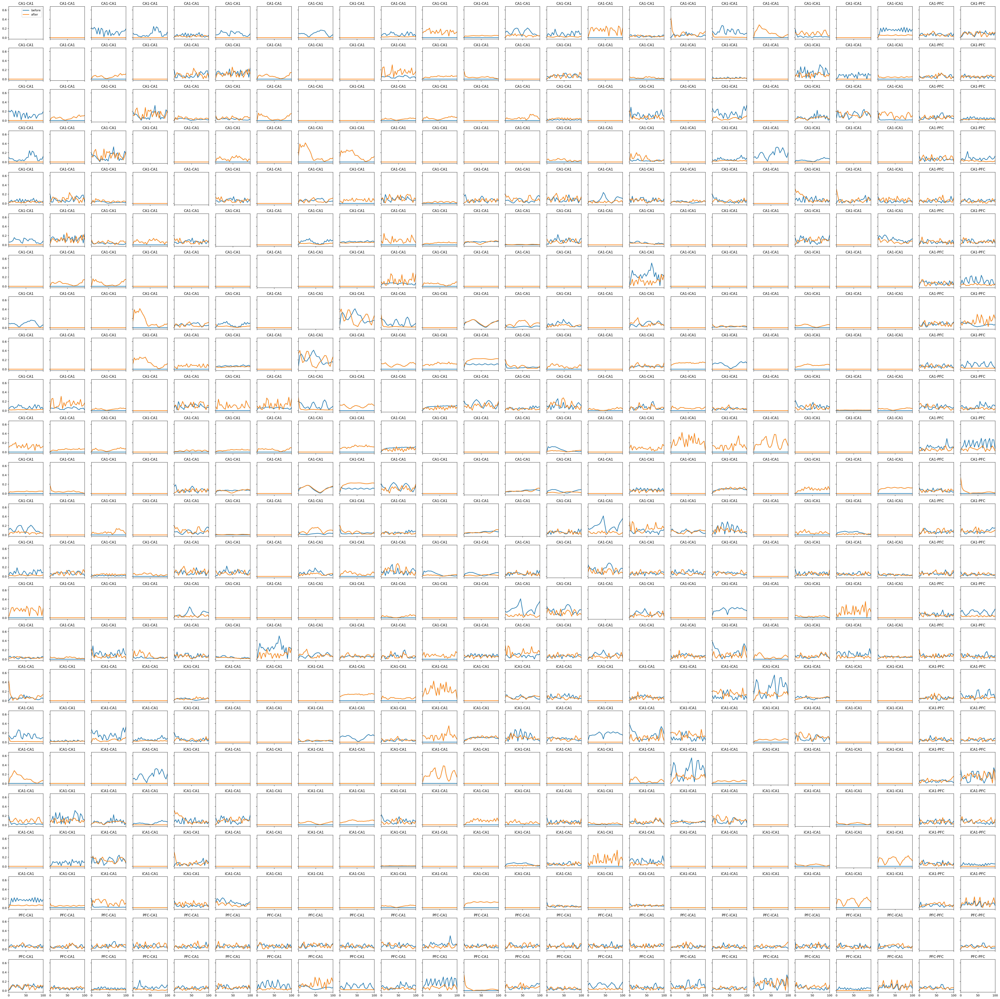

In [10]:
n_neurons = len(neuron_info)

fig, axes = plt.subplots(n_neurons, n_neurons,
                         figsize=(n_neurons * 2, n_neurons * 2),
                         sharex=True, sharey=True)

for neuron_ind1 in range(n_neurons):
    for neuron_ind2 in range(n_neurons):
        axes[neuron_ind1, neuron_ind2].plot(
            c.frequencies, coherence_magnitude[0, :, neuron_ind1, neuron_ind2],
            label='before', linewidth=2)
        axes[neuron_ind1, neuron_ind2].plot(
            c.frequencies, coherence_magnitude[1, :, neuron_ind1, neuron_ind2],
            label='after', linewidth=2)
        axes[neuron_ind1, neuron_ind2].set_title(
            neuron_info.iloc[neuron_ind1].area + '-'
            + neuron_info.iloc[neuron_ind2].area)
        

axes[0, 0].legend()
plt.xlim((0, 100))
plt.tight_layout()

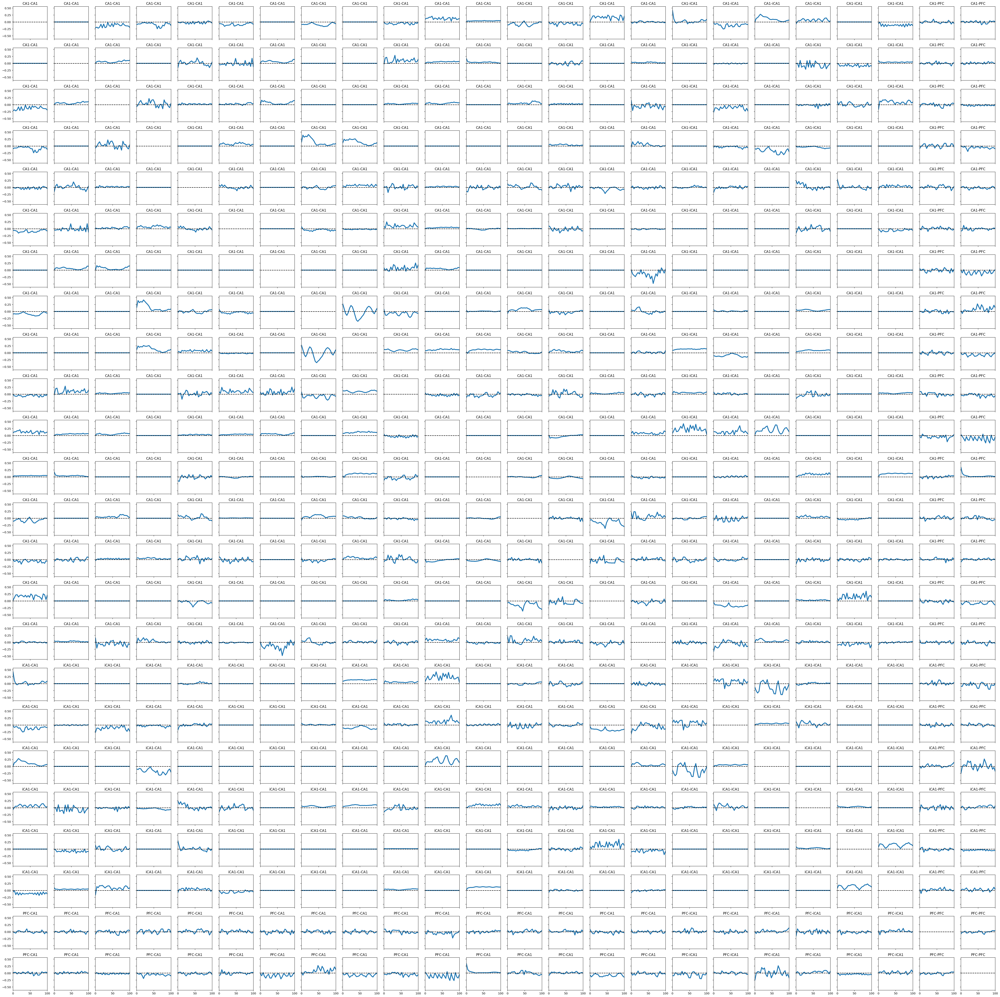

In [11]:
n_neurons = len(neuron_info)

fig, axes = plt.subplots(n_neurons, n_neurons,
                         figsize=(n_neurons * 2, n_neurons * 2),
                         sharex=True, sharey=True)

for neuron_ind1 in range(n_neurons):
    for neuron_ind2 in range(n_neurons):
        axes[neuron_ind1, neuron_ind2].plot(
            c.frequencies, coherence_change[0, :, neuron_ind1, neuron_ind2],
            linewidth=3)
        axes[neuron_ind1, neuron_ind2].set_title(
            neuron_info.iloc[neuron_ind1].area + '-'
            + neuron_info.iloc[neuron_ind2].area)
        axes[neuron_ind1, neuron_ind2].axhline(0, color='black', linestyle='--')

plt.xlim((0, 100))
plt.tight_layout()

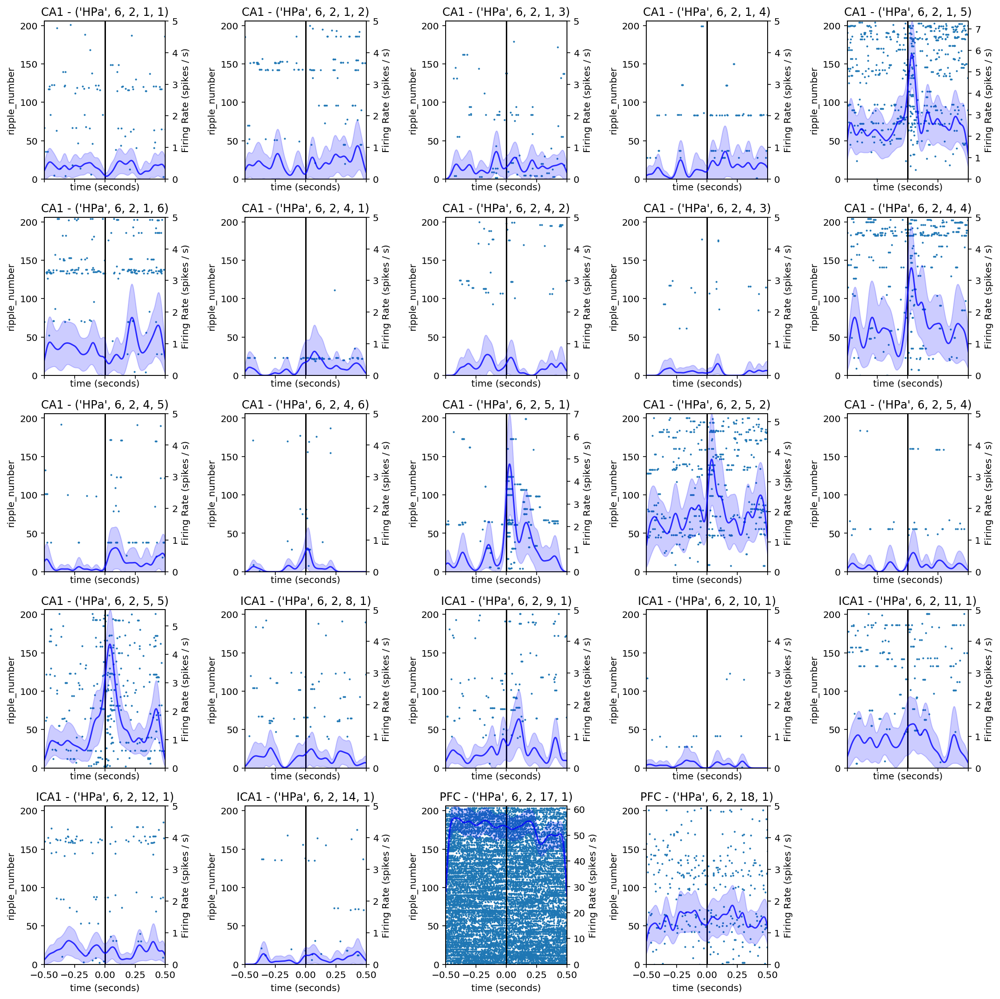

In [13]:
from src.visualization import plot_perievent_raster

neuron_keys = neuron_info.index
n_neurons = len(neuron_keys)

col_wrap = 5
n_rows = np.ceil(n_neurons / col_wrap).astype(int)

fig, axes = plt.subplots(n_rows, col_wrap, figsize=(col_wrap * 3, n_rows * 3), sharex=True, sharey=True)
for ax, neuron_key in zip(axes.ravel(), neuron_keys):
    plot_perievent_raster(neuron_key, ANIMALS, ripple_times,
                          tetrode_info, window_offset=(-0.5, 0.5),
                          ax=ax, s=1)
    
for ax in axes.ravel()[n_neurons:]:
    ax.axis('off')

plt.tight_layout()